In [2]:
import pandas as pd
import glob
import sys
from plotnine import *

In [4]:
# 파일 찾기
inpFile = '{}'.format('./한국산업인력공단_국가자격_CBT_통계_및_현황_정보_20211224.csv')
fileList = sorted(glob.glob(inpFile))

# 파일 없을 시 오류 처리
if fileList is None or len(fileList) < 1:
    print('[ERROR] inpFile : {} / {}'.format(inpFile, '입력 자료를 확인해주세요.'))
    sys.exit(1)

In [5]:
# 파일 읽기
data = pd.read_csv(fileList[0], encoding='EUC-KR')
data

,시행년도,시행월,시행일,시행회차,등급명,시행구분,종목명,지사명,응시자수,결시자수,중도포기자수,부정행위자수,합격자수,응시자전체시험시간,응시자전체총점
0,2021,1,2021-01-17,1,기능사,상시,굴착기운전기능사,서울,21,1,0,0,17,40050,1434.93
1,2021,1,2021-01-17,1,기능사,상시,지게차운전기능사,서울,41,2,0,0,34,77925,2883.17
2,2021,1,2021-01-17,1,기능사,상시,제과기능사,서울,38,6,0,0,25,80279,2466.53
3,2021,1,2021-01-17,1,기능사,상시,제빵기능사,서울,29,3,0,0,21,57180,1874.91
4,2021,1,2021-01-17,1,기능사,상시,한식조리 기능사,서울,79,8,0,0,42,168764,4771.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91455,2021,12,2021-12-24,43,기능사,상시,중식조리기능사,경기남부,2,0,0,0,1,2789,111.66
91456,2021,12,2021-12-24,43,기능사,상시,미용사(일반),경기남부,5,2,0,0,0,9322,266.65
91457,2021,12,2021-12-24,43,기능사,상시,미용사(피부),경기남부,7,6,0,0,3,10415,423.31
91458,2021,12,2021-12-24,43,기능사,상시,미용사(네일),경기남부,5,0,0,0,3,9691,318.32


In [6]:
# 등급명, 시행구분, 종목명에 따른 합계
dataL1 = data.groupby(['등급명', '시행구분', '종목명']).sum().reset_index()
dataL2 = dataL1.reset_index(drop=True)

dataL2

,등급명,시행구분,종목명,시행년도,시행월,시행회차,응시자수,결시자수,중도포기자수,부정행위자수,합격자수,응시자전체시험시간,응시자전체총점
0,기능사,상시,굴착기운전기능사,5028248,16985,55258,57225,11791,0,1,38772,108168170,3723445.00
1,기능사,상시,미용사(네일),5014101,16940,55108,35220,8265,0,0,17322,62790962,2062810.82
2,기능사,상시,미용사(메이크업),4929219,16626,54085,21733,4730,0,0,12627,38977919,1331840.02
3,기능사,상시,미용사(일반),5026227,16974,55218,54930,13275,0,0,19894,100802810,3011367.66
4,기능사,상시,미용사(피부),5020164,16946,55120,35725,10152,0,1,17798,67636324,2105658.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,산업기사,정기,해양조사산업기사,163701,405,972,221,46,0,0,180,449032,15765.00
272,산업기사,정기,화약류관리산업기사,141470,210,770,61,54,0,0,23,179612,3487.50
273,산업기사,정기,화약류제조산업기사,50525,75,275,20,13,0,0,9,74059,1143.75
274,산업기사,정기,화재감식평가산업기사,614384,2244,4010,1919,550,0,0,1657,5374720,133288.75


['기능사', '기능장', '산업기사']
['상시', '정기']


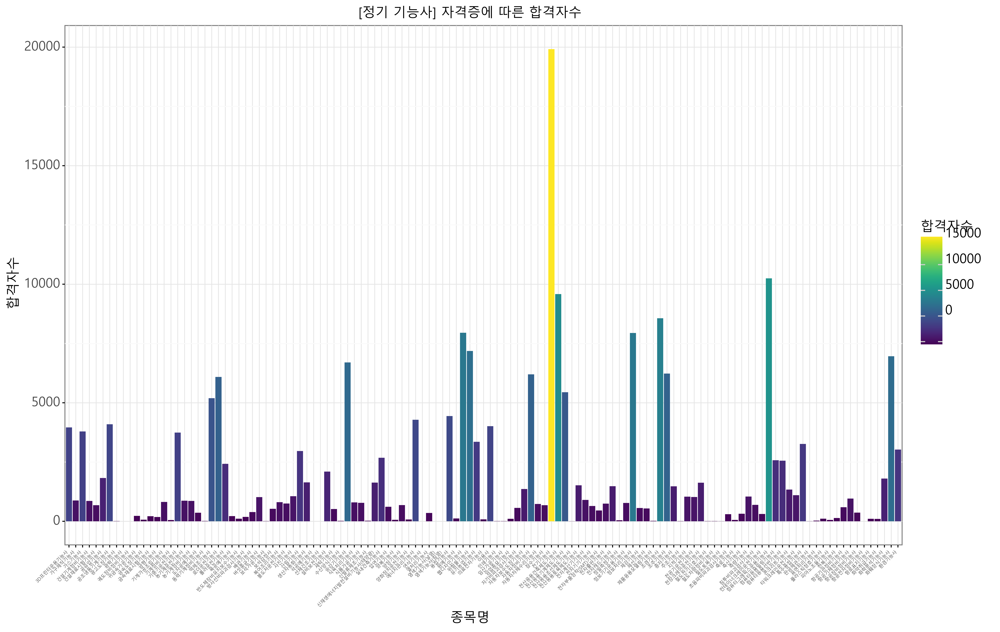

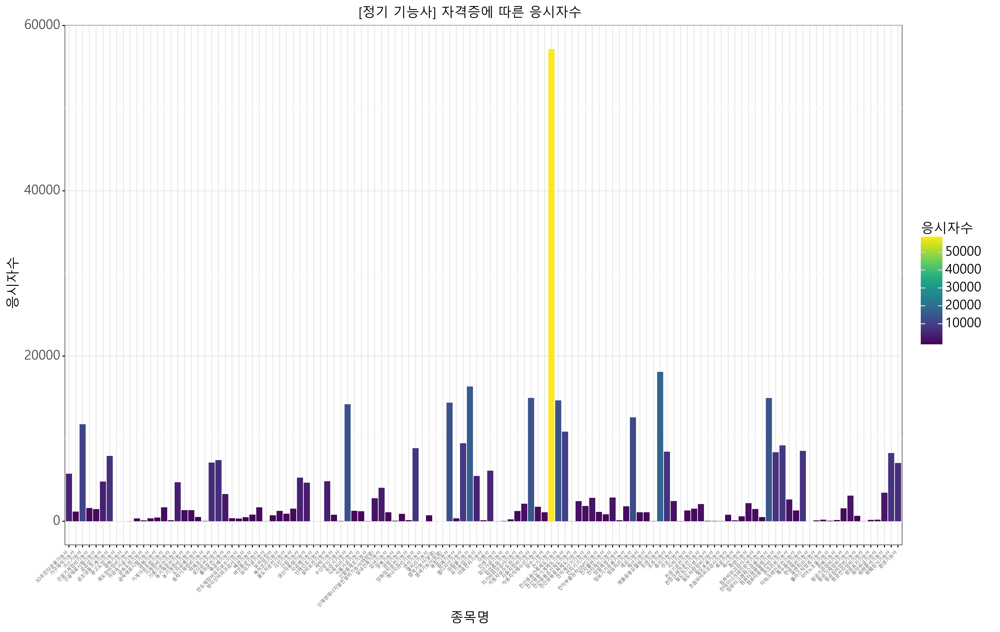

In [9]:
typeList = sorted(dataL2['등급명'].unique())
type2List = sorted(dataL2['시행구분'].unique())

print(typeList)
print(type2List)

for i, typeInfo in enumerate(typeList):
    for j, typeInfo2 in enumerate(type2List):
        dataL3 = dataL2.loc[
            (dataL2['등급명'] == typeInfo)
            & (dataL2['시행구분'] == typeInfo2)
            ]

        if (len(dataL3) < 1): continue

        if (len(dataL3['종목명']) < 30):
            xSize = 14
        else:
            xSize = 5

        # 합격자수
        mainTitle = '[{} {}] {}'.format(typeInfo2, typeInfo, '자격증에 따른 합격자수')

        plot = (
                ggplot(data=dataL3) +
                aes(x='종목명', y='합격자수', fill='합격자수') +
                theme_bw() +
                geom_bar(stat='identity') +
                labs(title=mainTitle, xlab='자격증', ylab='합격자수') +
                theme(
                    text=element_text(family="Malgun Gothic", size=14)
                    , axis_text_x=element_text(angle=45, hjust=1, size=xSize)
                    , axis_text_y=element_text(size=14)
                    , figure_size=(16, 10)
                    , dpi=600
                )
        )
        print(plot)

        # 응시자수
        mainTitle = '[{} {}] {}'.format(typeInfo2, typeInfo, '자격증에 따른 응시자수')

        plot = (
                ggplot(data=dataL3) +
                aes(x='종목명', y='응시자수', fill='응시자수') +
                theme_bw() +
                # geom_line() +
                geom_bar(stat='identity') +
                # coord_flip() +
                labs(title=mainTitle, xlab='자격증', ylab='응시자수') +
                theme(
                    text=element_text(family="Malgun Gothic", size=14)
                    , axis_text_x=element_text(angle=45, hjust=1, size=xSize)
                    , axis_text_y=element_text(size=14)
                    , figure_size=(16, 10)
                    , dpi=600
                )
        )
        print(plot)